### Run basic `scanpy` QC and doublet detection with `scrublet` for **PBMC Tuberculosis** _Cai Y et al 2020_

**Objective**: Review QC process and suggest changes

- **Developed by**: Carlos Talavera-López PhD
- **Modified by**: Mairi McClean
- **Computational Health Centre - Helmholtz Munich**
- ORIGINAL: v221014; MODIFIED: v221116

### Load required modules

In [1]:
import anndata
import logging
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scrublet as scr
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import rcParams

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.2.0
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.15.1
colorama            0.4.6
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.3
decorator           5.1.1
entrypoints         0.4
executing           1.1.1
google              NA
h5py                3.6.0
hypergeom_ufunc     NA
ipykernel           6.16.2
ipywidgets          8.0.2
jedi                0.18.1
joblib              1.2.0
kiwisolver          1.4.4
llvmlite            0.39.1
matplotlib          3.6.1
mpl_toolkits        NA
natsort             8.2.0
nbinom_ufunc        NA
ncf_ufunc           NA
numba               0.56.3
numexpr             2.8.1
numpy               1.23.4
packaging           21.3
pandas              1.5.1
parso               0.8.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources

### Read datasets

In [3]:
adata = sc.read_h5ad('/Users/mairi.mcclean/github/data/tb_pbmc_datasets/CaiY2020_PBMC_TB.raw.h5ad')
adata

AnnData object with n_obs × n_vars = 3701271 × 61533
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch'
    var: 'gene_name'

In [4]:
adata.var

,gene_name
gene_id,
ENSG00000223972.5,DDX11L1
ENSG00000227232.5,WASH7P
ENSG00000278267.1,MIR6859-1
ENSG00000243485.5,MIR1302-2HG
ENSG00000284332.1,MIR1302-2
...,...
ENSG00000198695.2,MT-ND6
ENSG00000210194.1,MT-TE
ENSG00000198727.2,MT-CYB


In [5]:
adata.obs

,study,individual,sample,tissue,donor,age,gender,status,data_type,centre,version,batch
barcode,,,,,,,,,,,,
AAACCTGAGAAACGAG-acTB3,CaiY_2021,SAMN14048025,PBMC_TB_3,PBMC,SAMN14048025,34,male,active_TB,scRNAseq,Shenzhen University,10XV2,acTB3
AAACCTGAGAAACGCC-acTB3,CaiY_2021,SAMN14048025,PBMC_TB_3,PBMC,SAMN14048025,34,male,active_TB,scRNAseq,Shenzhen University,10XV2,acTB3
AAACCTGAGAACAACT-acTB3,CaiY_2021,SAMN14048025,PBMC_TB_3,PBMC,SAMN14048025,34,male,active_TB,scRNAseq,Shenzhen University,10XV2,acTB3
AAACCTGAGAACAATC-acTB3,CaiY_2021,SAMN14048025,PBMC_TB_3,PBMC,SAMN14048025,34,male,active_TB,scRNAseq,Shenzhen University,10XV2,acTB3
AAACCTGAGAACTGTA-acTB3,CaiY_2021,SAMN14048025,PBMC_TB_3,PBMC,SAMN14048025,34,male,active_TB,scRNAseq,Shenzhen University,10XV2,acTB3
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCTTGTTTG-H1,CaiY_2021,SAMN14048019,PBMC_HC_1,PBMC,SAMN14048019,26,male,Healthy,scRNAseq,Shenzhen University,10XV2,H1
TTTGTCATCTTTACAC-H1,CaiY_2021,SAMN14048019,PBMC_HC_1,PBMC,SAMN14048019,26,male,Healthy,scRNAseq,Shenzhen University,10XV2,H1
TTTGTCATCTTTACGT-H1,CaiY_2021,SAMN14048019,PBMC_HC_1,PBMC,SAMN14048019,26,male,Healthy,scRNAseq,Shenzhen University,10XV2,H1


In [6]:
# checks the number of molecules counted per barcode(?), using "donor" as proxy(?)
adata.obs['donor'].value_counts()

SAMN14048024    619020
SAMN14048021    551750
SAMN14048022    531457
SAMN14048020    524019
SAMN14048019    519223
SAMN14048023    490097
SAMN14048025    465705
Name: donor, dtype: int64

In [7]:
adata.obs['data_type'].values

['scRNAseq', 'scRNAseq', 'scRNAseq', 'scRNAseq', 'scRNAseq', ..., 'scRNAseq', 'scRNAseq', 'scRNAseq', 'scRNAseq', 'scRNAseq']
Length: 3701271
Categories (1, object): ['scRNAseq']

Does this not mean that only scRNAseq data was included?

In [8]:
adata.var_names_make_unique()
sample_object = adata.copy()
sample_object

AnnData object with n_obs × n_vars = 3701271 × 61533
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch'
    var: 'gene_name'

### Replace gene symbols 

#### Performed to ensure that concatenation of the indexes is smoother

In [9]:
sample_object.var['gene_id'] = sample_object.var.index.copy()
sample_object.var.set_index('gene_name', inplace = True)
sample_object.var.head()

,gene_id
gene_name,
DDX11L1,ENSG00000223972.5
WASH7P,ENSG00000227232.5
MIR6859-1,ENSG00000278267.1
MIR1302-2HG,ENSG00000243485.5
MIR1302-2,ENSG00000284332.1


In [10]:
sample_object.var_names = [str(i) for i in sample_object.var_names]
sample_object.var_names_make_unique()


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/anndata/utils.py:111: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SNORD116-1', 'SNORD116-2', 'SNORD116-3', 'SNORD116-4', 'SNORD116-5']
  warnings.warn(


### Initial scatterplot of top 20 genes

> Inlcuded as per recommendations from Luecken & Theis

normalizing counts per cell


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:01)


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


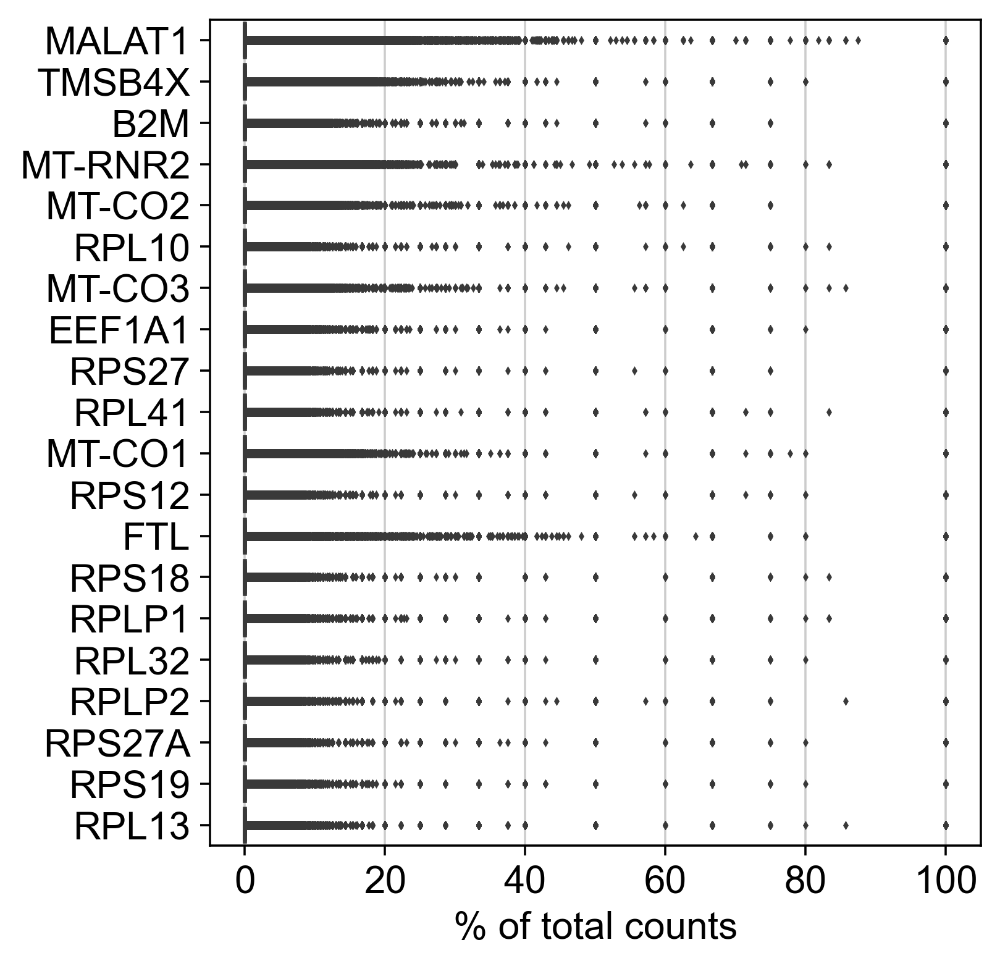

In [11]:
# highest fraction of counts per cell

sc.pl.highest_expr_genes(sample_object, n_top=20)

### Filter cells with less than 200 genes

In [12]:
sc.pp.filter_cells(sample_object, min_genes = 200)
print(sample_object.n_obs, sample_object.n_vars)

filtered out 3628125 cells that have less than 200 genes expressed
73146 61533


In [13]:
sample_object.shape

(73146, 61533)

In [14]:
sample_object.var

,gene_id
DDX11L1,ENSG00000223972.5
WASH7P,ENSG00000227232.5
MIR6859-1,ENSG00000278267.1
MIR1302-2HG,ENSG00000243485.5
MIR1302-2,ENSG00000284332.1
...,...
MT-ND6,ENSG00000198695.2
MT-TE,ENSG00000210194.1
MT-CYB,ENSG00000198727.2
MT-TT,ENSG00000210195.2


### Filter genes in less than 3 cells

In [15]:
# Parameters (cells=3) taken from scanpy tutorial [https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html]; others (https://support.parsebiosciences.com/hc/en-us/articles/360052794312-Scanpy-Tutorial-65k-PBMCs; https://blog.bioturing.com/2022/07/14/single-cell-quality-control/) say 5? Will revisit


sc.pp.filter_genes(sample_object, min_cells=3)

filtered out 25494 genes that are detected in less than 3 cells


### Compute QC stats

In [ ]:
# MT and ribo filtering is separated here, as I was unsure why ribosomal RNA was filtered out when it is not mentioned in other tutorials/resources

#### Remove mt genes

In [16]:
sample_object.shape

(73146, 36039)

In [17]:
sample_object.var['mt'] = sample_object.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(sample_object, qc_vars = ['mt'], percent_top = None, log1p = False, inplace = True)
sample_object.var

,gene_id,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
DDX11L1,ENSG00000223972.5,6,False,6,0.000082,99.991797,6.0
ENSG00000238009,ENSG00000238009.6,87,False,87,0.001230,99.881060,90.0
CICP27,ENSG00000233750.3,203,False,203,0.002789,99.722473,204.0
ENSG00000268903,ENSG00000268903.1,78,False,78,0.001080,99.893364,79.0
ENSG00000241860,ENSG00000241860.7,2299,False,2299,0.032934,96.856971,2409.0
...,...,...,...,...,...,...,...
MT-ND6,ENSG00000198695.2,10818,True,10818,0.183059,85.210401,13390.0
MT-TE,ENSG00000210194.1,626,True,626,0.008627,99.144177,631.0
MT-CYB,ENSG00000198727.2,70927,True,70927,9.182444,3.033659,671659.0
MT-TT,ENSG00000210195.2,228,True,228,0.003144,99.688295,230.0


#### Remove ribosomal RNA

> When would you *not* remove ribosomal RNA?
>> Asking as not included in a number of QC resources

In [18]:
sample_object.var['ribo'] = sample_object.var_names.str.startswith(("RPS","RPL"))
sc.pp.calculate_qc_metrics(sample_object, qc_vars = ['ribo'], percent_top = None, log1p = False, inplace = True)
sample_object.var

,gene_id,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
DDX11L1,ENSG00000223972.5,6,False,6,0.000082,99.991797,6.0,False
ENSG00000238009,ENSG00000238009.6,87,False,87,0.001230,99.881060,90.0,False
CICP27,ENSG00000233750.3,203,False,203,0.002789,99.722473,204.0,False
ENSG00000268903,ENSG00000268903.1,78,False,78,0.001080,99.893364,79.0,False
ENSG00000241860,ENSG00000241860.7,2299,False,2299,0.032934,96.856971,2409.0,False
...,...,...,...,...,...,...,...,...
MT-ND6,ENSG00000198695.2,10818,True,10818,0.183059,85.210401,13390.0,False
MT-TE,ENSG00000210194.1,626,True,626,0.008627,99.144177,631.0,False
MT-CYB,ENSG00000198727.2,70927,True,70927,9.182444,3.033659,671659.0,False
MT-TT,ENSG00000210195.2,228,True,228,0.003144,99.688295,230.0,False


In [19]:
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
# add the total counts per cell as observations-annotation to adata

mito_genes = sample_object.var_names.str.startswith('MT-')
sample_object.obs['percent_mt2'] = np.sum(
    sample_object[:, mito_genes].X, axis = 1).A1 / np.sum(sample_object.X, axis = 1).A1
sample_object.obs['n_counts'] = sample_object.X.sum(axis = 1).A1

In [20]:
sample_object

AnnData object with n_obs × n_vars = 73146 × 36039
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts'
    var: 'gene_id', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'

### Visualise QC metrics

In [21]:
sample_object.var_names

Index(['DDX11L1', 'ENSG00000238009', 'CICP27', 'ENSG00000268903',
       'ENSG00000241860', 'ENSG00000241599', 'WASH9P', 'ENSG00000228463',
       'ENSG00000237094', 'ENSG00000230021',
       ...
       'MT-ND4', 'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-ND5', 'MT-ND6', 'MT-TE',
       'MT-CYB', 'MT-TT', 'MT-TP'],
      dtype='object', length=36039)

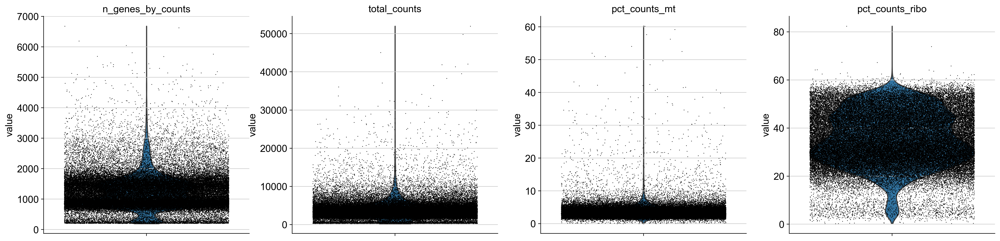

In [22]:
# This particular visualisation was from Anna's notebook.

sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

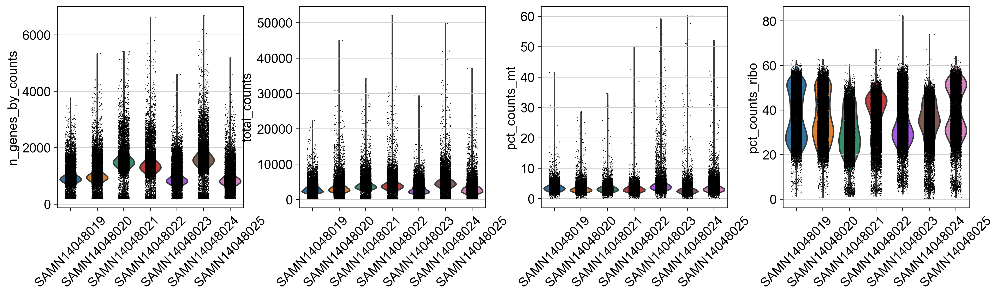

In [23]:

sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter = 0.2, groupby = 'donor', rotation = 45)

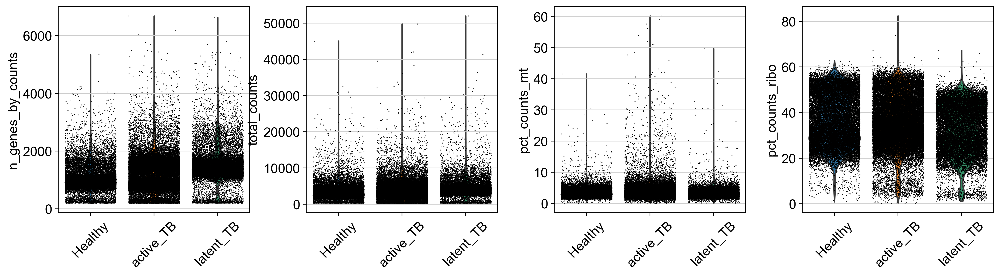

In [24]:
# Also taken from Anna's notebook

sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'status', rotation = 45)

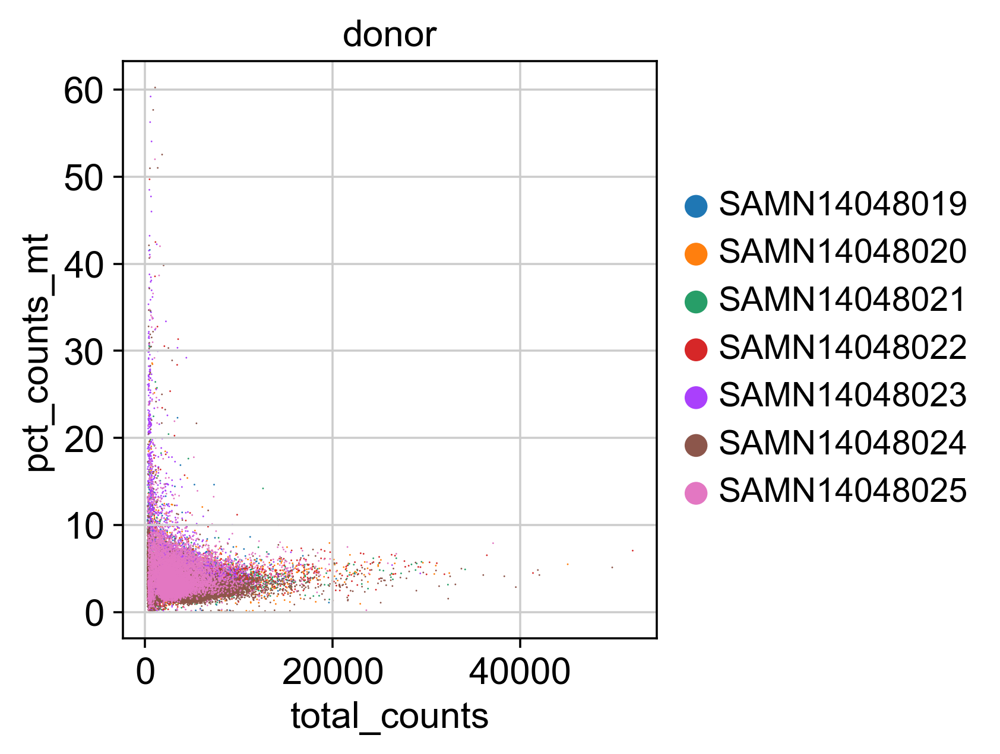

In [25]:
sc.pl.scatter(sample_object, x = 'total_counts', y = 'pct_counts_mt', color = "donor")

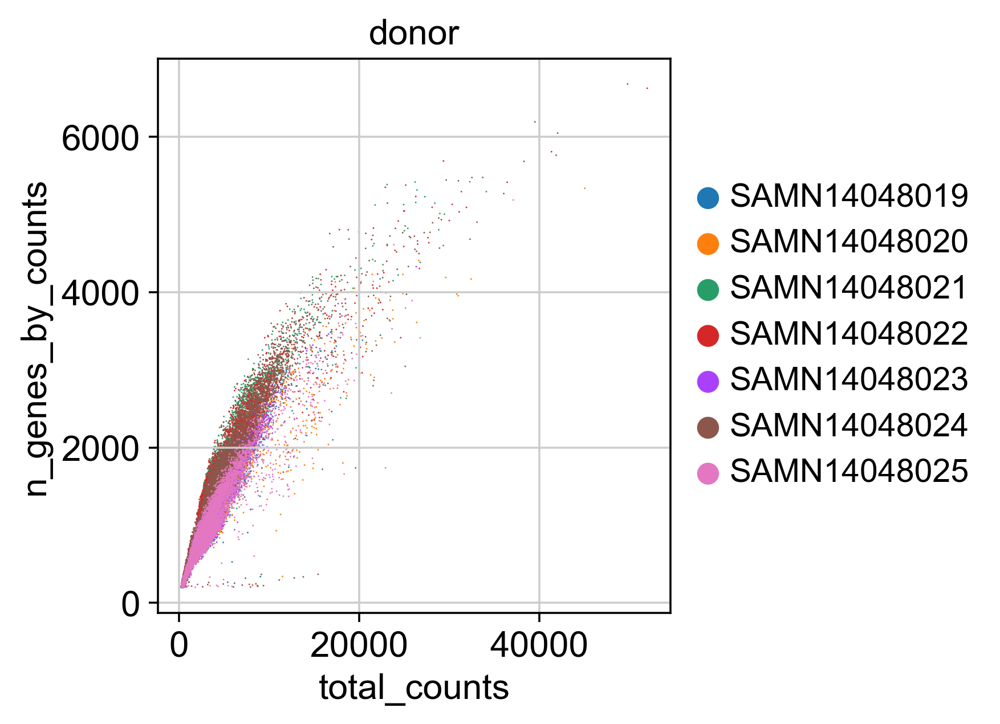

In [26]:
# This was done to visualize the data from another "angle", and also to reproduce graphs seen in the scanpy 3k PBMC tutorial (https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)

sc.pl.scatter(sample_object, x='total_counts', y='n_genes_by_counts', color = "donor")

### Filtering step

In [27]:
# https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html

sample_object = sample_object[sample_object.obs.n_genes_by_counts < 2500, :]
sample_object = sample_object[sample_object.obs.pct_counts_mt < 5, :]

### Add sample sex covariate

In [28]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

In [29]:
annot.head()

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
MT-TF,ENSG00000210049,577,647,MT
MT-RNR1,ENSG00000211459,648,1601,MT
MT-TV,ENSG00000210077,1602,1670,MT
MT-RNR2,ENSG00000210082,1671,3229,MT
MT-TL1,ENSG00000209082,3230,3304,MT


In [30]:
chrY_genes = sample_object.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['XGY2', 'RPS4Y1', 'HSFY3P', 'NAP1L1P2', 'ZFY', 'ZFY-AS1', 'LINC00278',
       'PCDH11Y', 'RPL26P37', 'FAM197Y9', 'SRIP3', 'PRKY', 'RN7SKP282',
       'RFTN1P1', 'ZNF736P9Y', 'LINC00279', 'TTTY18', 'USP9YP4', 'RBMY2QP',
       'GYG2P1', 'RPS24P1', 'RN7SL702P', 'USP9Y', 'CDY4P', 'DDX3Y', 'UTY',
       'PSMA6P1', 'TMSB4Y', 'ANOS2P', 'NLGN4Y', 'NLGN4Y-AS1', 'FAM224B',
       'TTTY14', 'ZNF839P1', 'BCORP1', 'TXLNGY', 'KDM5D', 'TTTY10', 'EIF1AY',
       'RPS4Y2', 'NEFLP1', 'PRORY', 'USP9YP3', 'RBMY2FP', 'CYCSP48'],
      dtype='object')

In [31]:
sample_object.obs['percent_chrY'] = np.sum(
    sample_object[:, chrY_genes].X, axis = 1).A1 / np.sum(sample_object.X, axis = 1).A1 * 100

/var/folders/g6/vfgrx_y95ml0h2lsgfx4jg6jwvdsz3/T/ipykernel_79353/1404846070.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sample_object.obs['percent_chrY'] = np.sum(


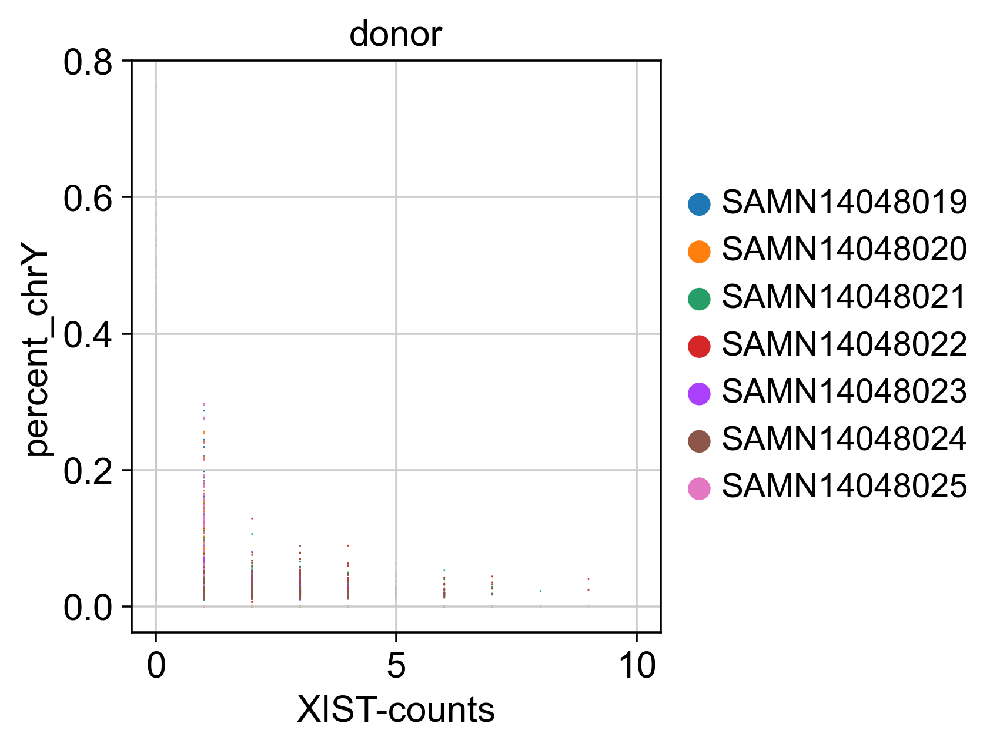

In [32]:
sample_object.obs["XIST-counts"] = sample_object.X[:,sample_object.var_names.str.match('XIST')].toarray()

sc.pl.scatter(sample_object, x = 'XIST-counts', y = 'percent_chrY', color = "donor")

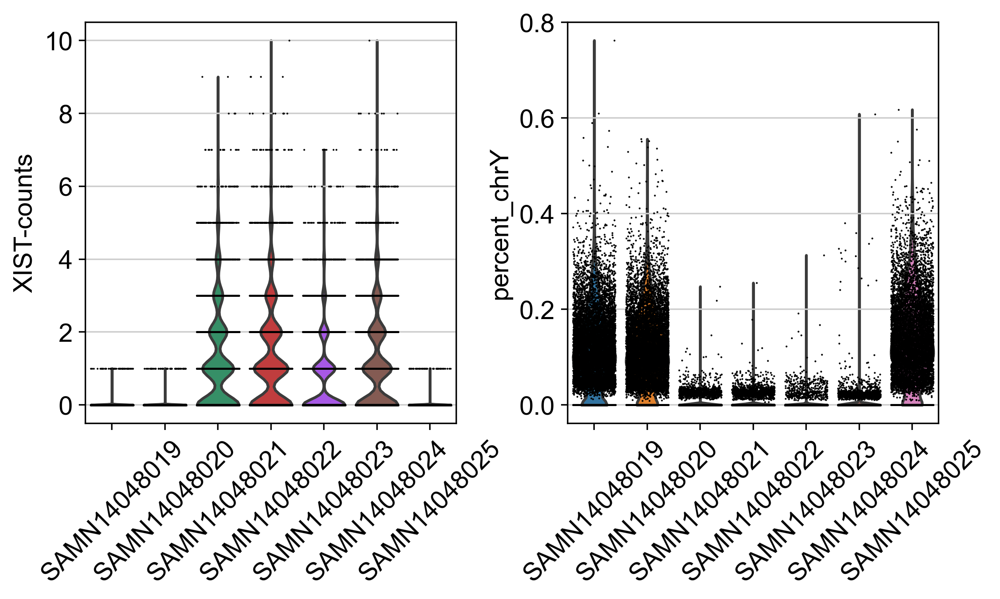

In [33]:
sc.pl.violin(sample_object, ["XIST-counts", "percent_chrY"], jitter = 0.4, groupby = 'donor', rotation = 45)

### Calculate cell cycle scores

In [34]:
!if [ ! -f /Users/mairi.mcclean/cell_cycle_gene.txt ]; then curl -o /Users/mairi.mcclean/cell_cycle_gene.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt; fi

In [35]:
cell_cycle_genes = [x.strip() for x in open('/Users/mairi.mcclean/cell_cycle_gene.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in sample_object.var_names]
print(len(cell_cycle_genes))

97
94


- Create basic `anndata` for score calculation

In [36]:
adata_log = anndata.AnnData(X = sample_object.X,  var = sample_object.var, obs = sample_object.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['SPRR3', 'S100A9', 'S100A8', 'RGS18', 'G0S2', 'TMSB10', 'IGKC', 'JCHAIN', 'CXCL8', 'PPBP', 'SPP1', 'ACTB', 'NAMPT', 'HBB', 'HBD', 'FTH1', 'MALAT1', 'LYZ', 'IGHA2', 'IGHG2', 'IGHA1', 'IGHG1', 'IGHM', 'B2M', 'HBA2', 'HBA1', 'MT2A', 'CCL4L2', 'H3-3B', 'FTL', 'IGLL5', 'IGLC2', 'IGLC3', 'TMSB4X', 'SAT1', 'TIMP1']
    finished (0:00:00)


calculating cell cycle phase
computing score 'S_score'


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    644 total control genes are used. (0:00:00)
computing score 'G2M_score'


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    816 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


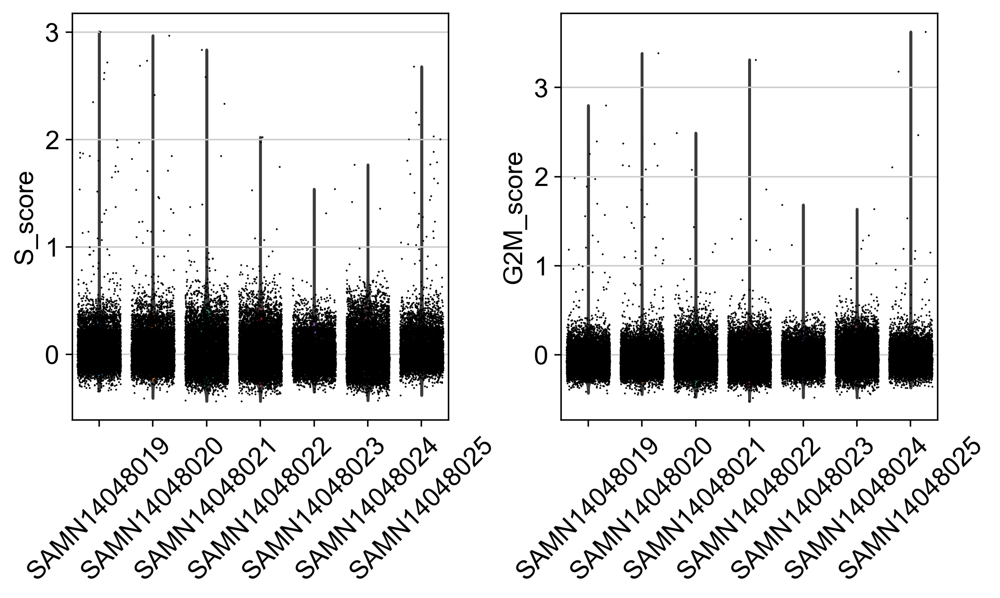

In [37]:
sc.tl.score_genes_cell_cycle(adata_log, s_genes = s_genes, g2m_genes = g2m_genes)
sc.pl.violin(adata_log, ['S_score', 'G2M_score'],
             jitter = 0.4, groupby = 'donor', rotation = 45)

In [38]:
sample_object.obs['S_score'] = adata_log.obs['S_score']
sample_object.obs['G2M_score'] = adata_log.obs['G2M_score']
sample_object

AnnData object with n_obs × n_vars = 62629 × 36039
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score'
    var: 'gene_id', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'donor_colors', 'status_colors'

### Predict doublets

Preprocessing...


/opt/homebrew/Caskroom/mambaforge/base/envs/scanpy_v1.9.1/lib/python3.10/site-packages/scrublet/helper_functions.py:252: RuntimeWarning: invalid value encountered in sqrt
  CV_input = np.sqrt(b);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.20
Detected doublet rate = 9.6%
Estimated detectable doublet fraction = 73.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 13.0%
Elapsed time: 118.8 seconds


5990

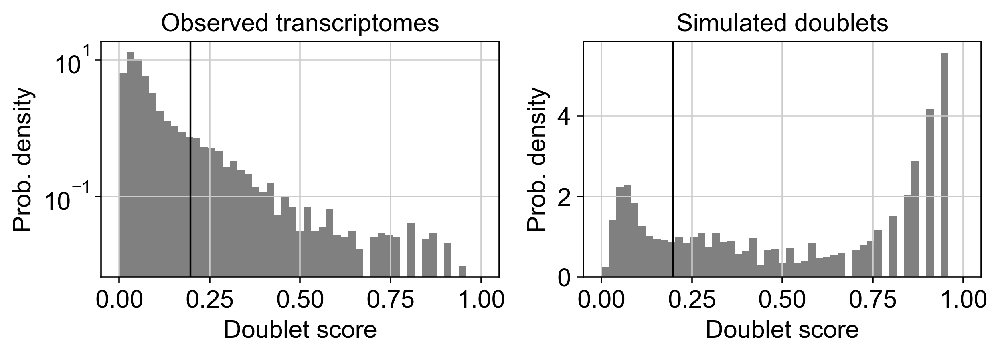

In [39]:
scrub = scr.Scrublet(sample_object.X)
sample_object.obs['doublet_scores'], sample_object.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

sum(sample_object.obs['predicted_doublets'])

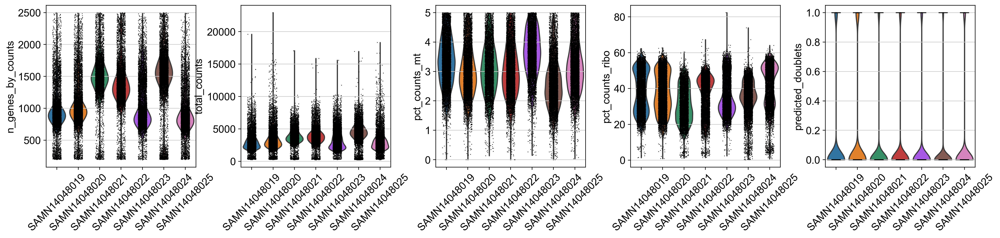

In [40]:
#check if our predicted doublets also have more detected genes in general; what would be the number required to raise suspicions?

sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'predicted_doublets'],
             jitter = 0.2, groupby = 'donor', rotation = 45)

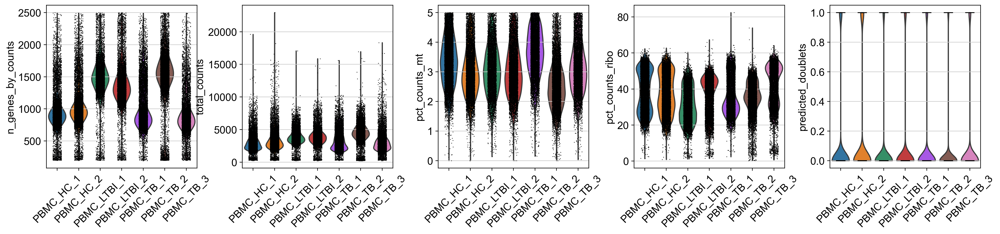

In [41]:
# Grouped by 'sample', just to see
sc.pl.violin(sample_object, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo', 'predicted_doublets'],
             jitter = 0.2, groupby = 'sample', rotation = 45)

### Prepare counts for individual slots

#### Preparation for data normalization?
> Is this step normally included in QC?

In [42]:
sample_object.raw = sample_object.copy()
sample_object.layers['counts'] = sample_object.X.copy()
sample_object.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(sample_object, inplace = False)["X"]
)
sample_object

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 62629 × 36039
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'doublet_scores', 'predicted_doublets'
    var: 'gene_id', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'donor_colors', 'status_colors', 'sample_colors'
    layers: 'counts', 'sqrt_norm'

### Identification of highly variable genes

#### Where should this be done? After log transformation?

> The previous cell contains the code "sc.pp.normalize_total", which will normalize the data.
>> Anna did not do that (but her 'sc.pp.highly_variable_genes' classes are slightly different to mine)
>> In the scanpy tutorial (https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html), the highly_variable_genes is run after normalization

In [43]:
sc.pp.highly_variable_genes(sample_object, min_mean=0.0125, max_mean=3, min_disp=0.5)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


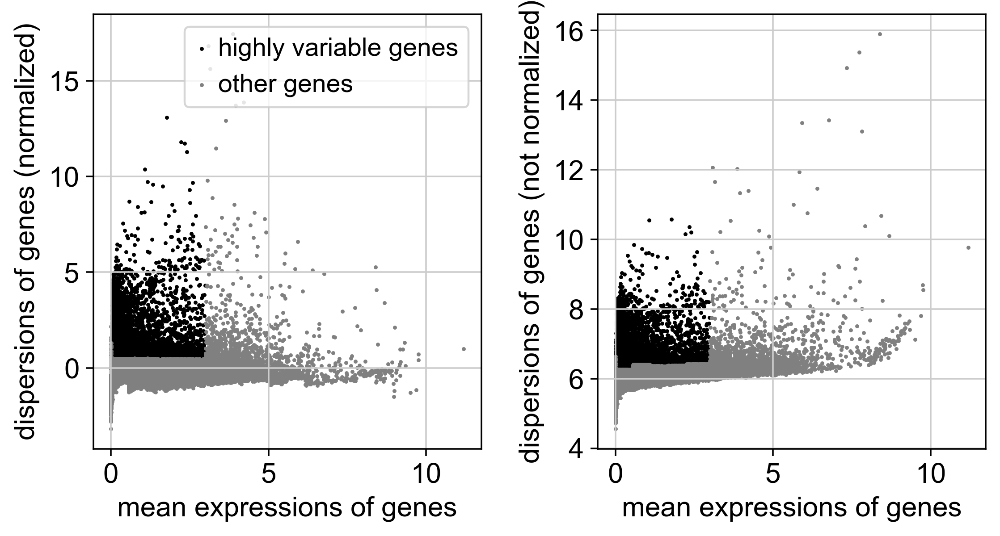

In [44]:
# These graphs are suggested in scanpy tutorial (https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html) and in Anna's notebook
sc.pl.highly_variable_genes(sample_object)

### Export object

In [47]:
sample_object.write('/Users/mairi.mcclean/github/data/tb_pbmc_datasets/CaiY2020_PBMC_TB_QCed_pre-process_mm221121.h5ad')